# Who Stole my lunch?

The goal of this notebook is to solve, using a score-based generative model, the following problem:

Somebody stole the lunch of one of the employes of a given company. The employe got access to a security camera image of somebody exiting the common area with his lunch but the picture is low quality. Who stole his lunch?

In [2]:
#!pip install accelerate diffusers facenet-pytorch datasets scikit-learn

In [3]:
from diffusers import DDIMScheduler, UNet2DModel
from PIL import Image
import torch
from torchvision.transforms.functional import pil_to_tensor
from torchvision.transforms import Compose, Normalize
from datasets import load_dataset
from facenet_pytorch import MTCNN, InceptionResnetV1
from tqdm import tqdm
import numpy as np


## Helper functions
def img_to_tensor(img):
    return (pil_to_tensor(img) / 255 - 0.5)*2

def tensors_to_img(dt, rescale=True):
    if rescale:
        images = ((dt / 2 + 0.5).clamp(0, 1)*255).round()
    else:
        images = dt
    images = images.cpu().permute(0, 2, 3, 1).numpy()
    images = [Image.fromarray(image.astype(np.uint8)) for image in images]
    return images

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid


## Loading dataset
ds = load_dataset("korexyz/celeba-hq-256x256")

#Loading diffusion related objects
model_id = "google/ddpm-celebahq-256"
scheduler = DDIMScheduler.from_pretrained(model_id)
model = UNet2DModel.from_pretrained(model_id).to("cuda").eval().requires_grad_(False)

# Setting number of steps for the reverse diffusion.
scheduler.set_timesteps(50)


# Face detection pipeline MTCNN:
mtcnn = MTCNN(keep_all=True, select_largest=True, post_process=True, device="cuda:0").requires_grad_(False) # Receives PIL images as inputs!

# Embedding network: For the picture of a face (output of mtcnn) create an embedding vector that represents the face.
#This embedding is trained using contrastive learning so that pictures of the same person are close together than pictures of two different people.
resnet = InceptionResnetV1(pretrained='vggface2').eval().to("cuda:0").requires_grad_(False)



An error occurred while trying to fetch google/ddpm-celebahq-256: google/ddpm-celebahq-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [4]:
# Indexes of the validation set corresponding to the "suspects" and the observation
observation_index = 499
suspect_indexes = [1559, 155, 1979, 818, 1313, 1870, 1821, 846, 1485, 1844, 548, 1564, 521, 621, 321, 1316, 220, 650, 1981, 598]

# Operator that goes from high resolution to low resolution. Equivalent of the forward operator.
low_res_operator = torch.nn.AvgPool2d(18, 18)


#This might take a while to run...
observation = low_res_operator(img_to_tensor(ds["validation"]["image"][observation_index]))
observation_img = tensors_to_img(observation[None])[0]

suspect_images = [ds["validation"]["image"][idx] for idx in suspect_indexes]

## The photo of the suspect

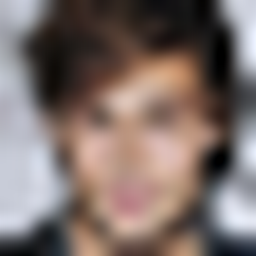

In [5]:
observation_img.resize((256, 256), Image.Resampling.LANCZOS)

## All your coworkers

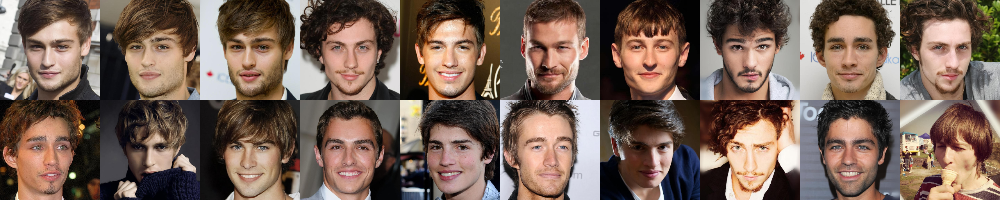

In [6]:
image_grid(suspect_images, rows=2, cols=10)

### Suggestions to begin with:

1. It is a good idea to start by implementing just the generative model part. This can help you: https://huggingface.co/docs/diffusers/using-diffusers/write_own_pipeline
2. Implement then the DPS algorithm to sample from the inverse problem: https://arxiv.org/abs/2209.14687


In [7]:
suspected_faces_cropped = mtcnn(suspect_images)
# Calculate embedding (unsqueeze to add batch dimension)
suspect_img_embeddings = resnet(torch.stack([i[0] for i in suspected_faces_cropped]).cuda())

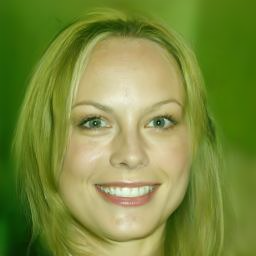

In [8]:
sample_size = model.config.sample_size
noise = torch.randn((5, 3, sample_size, sample_size), device="cuda")

def generate(noise, model, scheduler):
    sample = noise
    for t in scheduler.timesteps:
        with torch.no_grad():
            noisy_residual = model(sample, t).sample
            prev_noisy_sample = scheduler.step(noisy_residual, t, sample, eta=0.1).prev_sample
            sample = prev_noisy_sample
    return sample

gen_images = generate(noise, model, scheduler).cpu()
tensors_to_img(gen_images, rescale=True)[0]

In [9]:
def generate_dps(noise, model, scheduler, measure_operator, observation, coeff=0.1):
    sample = noise
    for t in tqdm(scheduler.timesteps):
        sample.requires_grad_(True)
        noisy_residual = model(sample, t).sample
        
        #DPS
        alpha_t = scheduler.alphas_cumprod[t]
        pred_x0 = (1 / (alpha_t**.5))*(sample - ((1 - alpha_t)**.5) * noisy_residual)
        
        observation_residual = observation[None] - measure_operator(pred_x0)
        (observation_residual**2).sum(dim=(-3, -2, -1)).sum().backward()
        grad_residue = sample.grad
        coeff_grad_residue = - coeff / ((observation_residual**2).sum(dim=(-3, -2, -1))**.5)[..., None, None, None]
        
        
        prev_noisy_sample = scheduler.step(noisy_residual.detach(), t, sample.detach(), eta=.1, use_clipped_model_output=True).prev_sample
        sample = (prev_noisy_sample + coeff_grad_residue * grad_residue).detach()
        sample.requires_grad_(False)
        
    return sample.detach()


In [10]:
n_tot_samples = 50
batch_size = 8
n_batches = n_tot_samples // batch_size + (n_tot_samples % batch_size !=0)
dps_imgs = []
dps_reconstructions = []
for _ in range(n_batches):
    noise = torch.randn((batch_size, 3, sample_size, sample_size), device="cuda")
    dps_out = generate_dps(noise, model, scheduler, low_res_operator, observation.cuda(), 5)
    dps_imgs += tensors_to_img(dps_out)
    dps_reconstructions += tensors_to_img(low_res_operator(dps_out))
    

100%|██████████| 50/50 [00:21<00:00,  2.35it/s]


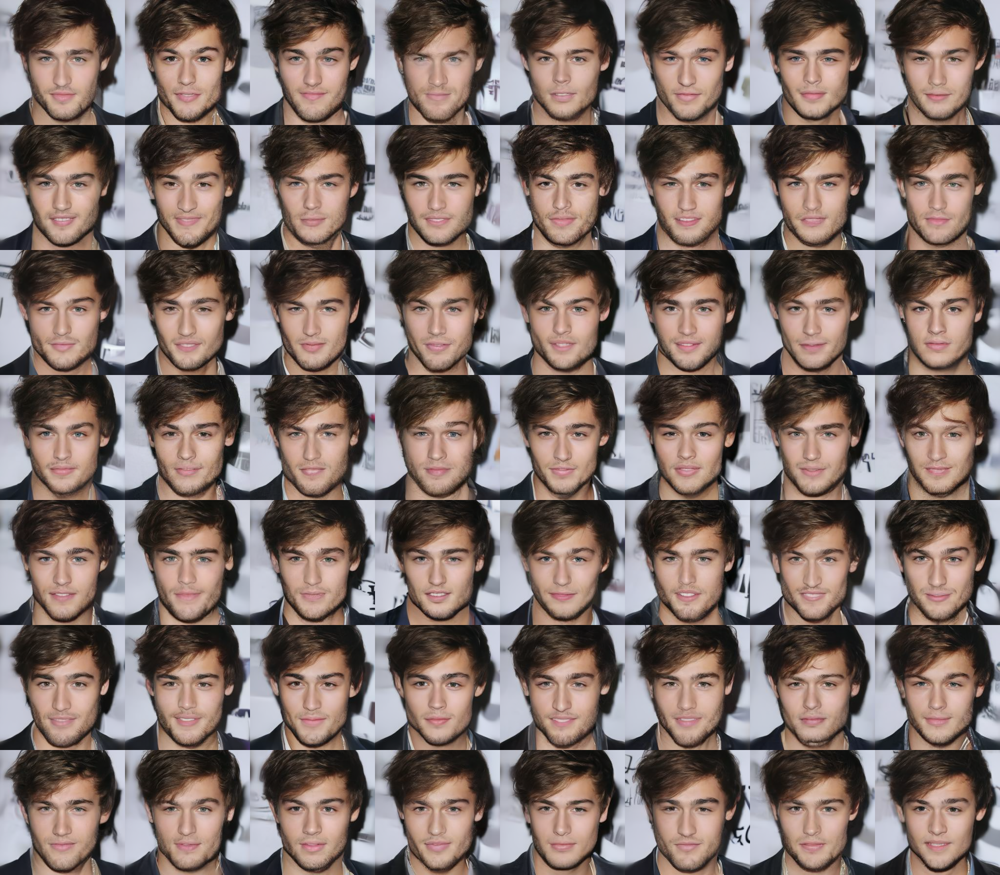

In [11]:
image_grid(dps_imgs, rows=n_batches, cols=batch_size)

Text(0.5, 0, '$-\\frac{1}{2}\\|A(x) - y\\|^2$')

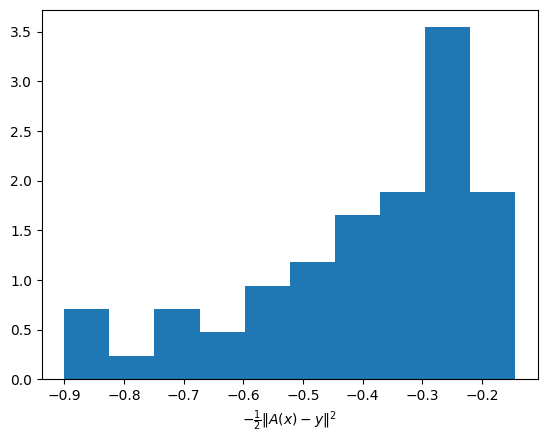

In [12]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1)
ax.hist([-0.5*(torch.linalg.vector_norm(img_to_tensor(img) - observation, dim=(-3, -2, -1))**2).item() for img in dps_reconstructions], density=True)
ax.set_xlabel(r"$-\frac{1}{2}\|A(x) - y\|^2$")

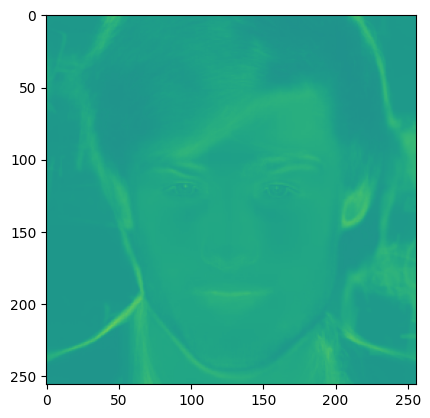

In [13]:
import matplotlib.pyplot as plt
plt.imshow(torch.stack([img_to_tensor(img) for img in dps_imgs]).std(dim=(0, 1)), vmin=-1, vmax=1)

In [14]:
dps_img_cropped = mtcnn(dps_imgs)

# Calculate embedding (unsqueeze to add batch dimension)
dps_img_embeddings = resnet(torch.cat(dps_img_cropped).cuda())

# The posterior:

We denote by:

    1 $X$ a picture
    2 $pp$ a person, thus our suspects form a dataset $\{pp_1, pp_2, \cdots, pp_N\}$. Each suspect has a photo $\{X_1, \cdots, X_n\}$.
    3 An observation $y$
    4 The face embedding network $\psi$. Each face embedding of the suspects is denoted by $\{e_1, \cdots, e_N\}$.
  
We define the following prior:

$P(pp_i, x, y) = Cat(Softmax({-\omega_i d(\psi(x), e_i)})) p_{0}(x) p(y|x)$

where $p_{0}(X)$ is the generative model and $p(y|X) = \mathcal{N}(y; Ax, \sigma_y^2 I)$ and $A$ is the low resolution operator and $d$ a distance of choice, as the weights $\omega_i$.

Our goal is to sample from the posterior

$P(pp_i | y) = \int Cat(Softmax({-\omega_i d(\psi(x), e_i)})) p_{0}(x | y) dx$.


tensor([0, 1, 2, 0, 2, 1, 0, 0, 2, 0, 0, 2, 0, 1, 1, 2, 1, 1, 2, 0],
       device='cuda:0')


/tmp/ipykernel_938634/210650680.py:2: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  indexes_posterior = torch.distributions.Categorical(probs=torch.nn.functional.softmax(- projections.mean(dim=-1))).sample((20,))


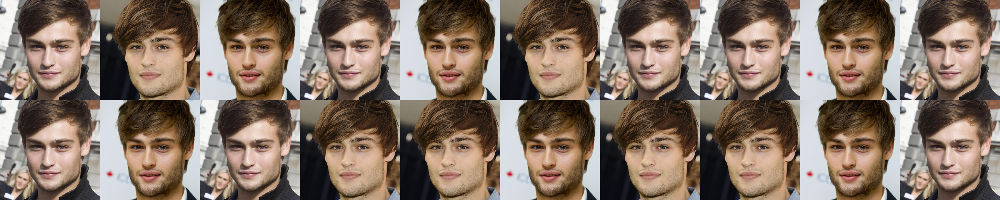

In [15]:
projections = torch.linalg.vector_norm(suspect_img_embeddings[:, None] - dps_img_embeddings[None, :], dim=-1, ord=1)
indexes_posterior = torch.distributions.Categorical(probs=torch.nn.functional.softmax(- projections.mean(dim=-1))).sample((20,))

print(indexes_posterior)
image_grid([suspect_images[i] for i in indexes_posterior], rows=2, cols=10)

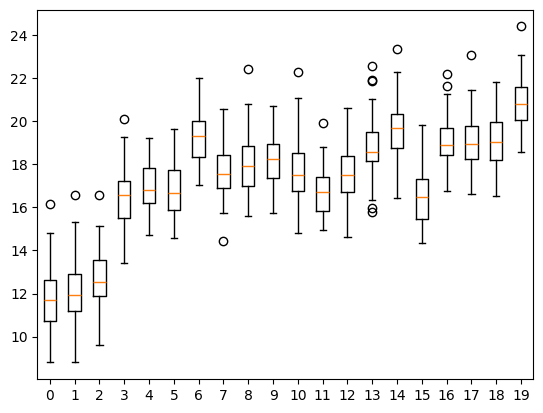

In [16]:
import matplotlib.pyplot as plt
plt.boxplot(
projections.T.detach().cpu().numpy(),
positions=list(range(len(suspect_indexes)))
)
plt.show()